# 05: PnP-ADMM Exploration and Component Development

This notebook serves two purposes:

1. **Component development:** Every reusable function (geometry, FBP, ADMM, metrics) is built and tested here first, then moved to the `ct_tfpnp` package.

2. **Sensitivity analysis:** The fixed PnP-ADMM parameters are explored to motivate the TFPnP adaptive policy.

### Components developed in this notebook

| Component | Developed here | Moved to package |
|-----------|---------------|-----------------|
| CT geometry | § 3 | `experiments/parallel_beam_ct.py` |
| PSNR, SSIM, HaarPSI, ls_scale | § 4 | `evaluation/metrics.py` |
| Lung slice detection | § 4 | `datasets/lidc.py` |
| FBP reconstruction | § 5 | `ct_ops/fbp.py` |
| TV reconstruction | § 4 | `ct_ops/tv.py` |
| ADMM step | § 8 | `ct_ops/admm.py` |

Runs on CSD3 with LION operator and GPU.

## 1. Setup

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import math
from pathlib import Path

# LION imports
from LION.CTtools.ct_utils import make_operator
from LION.CTtools.ct_geometry import Geometry
from LION.utils.parameter import LIONParameter
from LION.experiments.ct_experiments import Experiment

# set device
device = torch.device("cuda")
print(f"device: {device}")
print(f"GPU   : {torch.cuda.get_device_name()}")

# set consistent plotting style for all notebook cells
plt.rcParams.update({
    "figure.dpi": 150,
    "axes.titlesize": 12,
    "axes.labelsize": 10,
    "image.cmap": "gray",
    "image.interpolation": "nearest",
})

# create output directory for figures
output_dir = Path("../figures/05")
output_dir.mkdir(parents=True, exist_ok=True)

print("Setup complete")

device : cuda
GPU    : NVIDIA A100-SXM4-80GB
Setup complete


## 2. The PnP-ADMM Algorithm

Standard ADMM aims to minimise:

$$\min_x \; D(x) + \lambda R(x)$$

for data fidelity $D$ and regulariser $R$, where both may be non smooth or have difficult to compute gradients. 

ADMM splits the problem into separate, easier subproblems, by introducing an auxiliary variable $z$.

$$\min_{x, z} \; D(x) + \lambda R(z)$$

The augmented lagrangian is used to enforce $x = z$ by turning the constraint into a penalty:

$$L(x, z, u) = D(x) + R(z) + \frac{\mu}{2}\lVert x - z + u \rVert^2$$

where the dual variable $u$ is a scaled lagrangian multiplier, and is used to keep track of how well the $x = z$ condition is satisfied, with parameter $\mu$ controlling the strength with which it is enforced.

Plug-and-Play ADMM (Venkatakrishnan et al., 2013) replaces the proximal operator of $R$ with an image denoiser $\mathcal{H}_\sigma$ for noise level $\sigma$:

$$x^{k+1} = \mathcal{H}_{\sigma_k}(z^k - u^k)$$
$$z^{k+1} = \text{Prox}_{\frac{1}{\mu_k} D}(x^{k+1} + u^k)$$
$$u^{k+1} = u^k + x^{k+1} - z^{k+1}$$

##### Note on notation:

The paper uses a slightly different variable convention than some textbooks. In equations (7–9) of Wei et al.:

- The x-step is the proximal step on R, and is where we plug in the denoiser. 
- The z-step is the proximal step on D, and aims to minimise D while staying close to $x^{k+1} + u^k$, which enforces data consistency.
- The u-step updates the scaled dual variable.

For CT, the z-step proximal operator has no closed form and is solved by gradient descent for differentiability.

The two internal parameters are:

- $\sigma_k$: denoising strength at iteration $k$ (controls how aggressively the prior is applied)
- $\mu_k$: penalty parameter at iteration $k$ (controls the trade-off between prior and data fidelity)

The central problem in this algorithm is that optimal $(\sigma_k, \mu_k)$ are image-dependent and iteration-dependent, meaning that different images need different schedules, and therefore implementing this on a large dataset is incredibly time consuming, requiring parameters to be chosen for each image. TFPnP solves this problem by learning to predict parameters automatically.

## 3. CT Geometry Development

The TFPnP paper geometry parameters are implemented in this project as follows:

| Parameter | Value | Rationale |
|-----------|-------|-----------|
| Views | 30 | Matches paper|
| Detectors | 725 = ceil(512×√2) | Full diagonal coverage (same principle as paper's 182 = ceil(128×√2)) |
| Beam | Parallel | Matches paper |
| Spacing | Unit (1 pixel = 1 unit) | LION convention |
| Angles | [0, π) | Standard for parallel beam|

The detector count `ceil(N×√2)` ensures the detector array spans the full diagonal of the image. Without this, corners of the image are truncated, causing boundary artefacts.

In [ ]:
# set geometry parameters
N_VIEWS = 30
IMG_SIZE = 512
n_det = math.ceil(IMG_SIZE * math.sqrt(2))

print(f"Detector count: ceil({IMG_SIZE} × √2) = {n_det}")
print(f"Paper used:     ceil(128 × √2) = {math.ceil(128 * math.sqrt(2))}")
print(f"Same geometric principle at different resolution.")

# create geometry
image_shape = [1, IMG_SIZE, IMG_SIZE]
geometry = Geometry(
    image_shape=image_shape,
    image_size=image_shape,          
    detector_shape=[1, n_det],
    detector_size=[1, n_det],         
    dso=IMG_SIZE * 2,                 
    dsd=IMG_SIZE * 4,              
    mode="parallel",
    angles=np.linspace(0, np.pi, N_VIEWS, endpoint=False),
)

# create operator
op = make_operator(geometry)

print(f"\nGeometry created: {N_VIEWS}-view parallel beam, {n_det} detectors")
print(f"Operator: op.forward(x) → sinogram, op.adjoint(y) → backprojection")

Detector count: ceil(512 × √2) = 725
Paper used:     ceil(128 × √2) = 182
Same geometric principle at different resolution.

Geometry created: 30-view parallel beam, 725 detectors
Operator: op.forward(x) → sinogram, op.adjoint(y) → backprojection


### Moving to the package

This geometry definition is now placed in a `ParallelBeamSparseViewCT` class that inherits from LION's `Experiment` base class, and saved to `ct_tfpnp/experiments/parallel_beam_ct.py`.

In [ ]:
# load from package
from ct_tfpnp.experiments.parallel_beam_ct import experiment

# make geometry and operator
geo_pkg = experiment.experiment_params.geometry
op_pkg = make_operator(geo_pkg)

# verify geometry matches inline definition
print(f"Package geometry: {len(geo_pkg.angles)} views, {geo_pkg.detector_shape[1]} detectors, {geo_pkg.mode} beam")
print(f"Match: {len(geo_pkg.angles) == N_VIEWS and geo_pkg.detector_shape[1] == n_det}")
print("✓ Geometry verified — package matches inline definition")

Package geometry: 30 views, 725 detectors, parallel beam
Match: True
✓ Geometry verified — package matches inline definition


## 4. Evaluation Metrics Development

Several metrics are needed to evaluate reconstruction quality, each chosen to serve a different purpose:

| Metric | What it measures | Why we need it |
|--------|-----------------|----------------|
| **PSNR** | Pixel-level error (dB) | Standard metric, used in paper Table 5 |
| **ls_scale** | Optimal intensity alignment | Corrects FBP/ADMM brightness before computing PSNR |
| **SSIM** | Structural similarity | Captures perceptual quality better than PSNR |
| **HaarPSI** | Wavelet-based perceptual similarity | Correlates most with radiologist preference |
| **is_lung_slice** | Whether a CT slice contains lungs | Ensures we evaluate on relevant anatomy |

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# METRIC 1: PSNR
# ═══════════════════════════════════════════════════════════════════════════
def psnr_np(gt, recon):
    """
    PSNR using GT data range. Accepts tensors or numpy arrays.
    """
    # convert to numpy if inputs are tensors
    if isinstance(gt, torch.Tensor): gt = gt.detach().cpu().numpy()
    if isinstance(recon, torch.Tensor): recon = recon.detach().cpu().numpy()

    # convert to float64 and squeeze
    gt = np.asarray(gt, dtype=np.float64).squeeze()
    recon = np.asarray(recon, dtype=np.float64).squeeze()

    # compute MSE
    mse_val = np.mean((gt - recon) ** 2)
    
    # compute data range
    data_range = float(gt.max() - gt.min())

    # compute PSNR
    if mse_val < 1e-14:
        return float('inf')
    return 10.0 * math.log10(data_range**2 / mse_val)

# define test case and verify
x_test = np.random.rand(64, 64)
x_noisy = x_test + 0.1 * np.random.randn(64, 64)
print(f"PSNR test: clean vs noisy = {psnr_np(x_test, x_noisy):.1f} dB")
print(f"PSNR test: clean vs clean = {psnr_np(x_test, x_test):.1f} dB (should be inf)")

PSNR test: clean vs noisy = 19.9 dB
PSNR test: clean vs clean = inf dB (should be inf)


In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# METRIC 2: ls_scale
# ═══════════════════════════════════════════════════════════════════════════
# Least-squares optimal scalar alignment finds α minimising ||gt - α·recon||².

# Needed because FBP and ADMM produce reconstructions at arbitrary intensity scales, so PSNR would be misleadingly low due to a simple brightness mismatch.

def ls_scale(gt, recon):
    """
    Returns α·recon where α = argmin ||gt - α·recon||².
    """
    # compute least-squares scale factor
    alpha = (gt * recon).sum() / ((recon * recon).sum() + 1e-12)

    # return scaled reconstruction
    return recon * alpha

# define test case and verify
gt_t = torch.rand(1, 64, 64)
recon_t = gt_t * 0.5 + 0.01 * torch.randn(1, 64, 64)  # half brightness + noise
scaled = ls_scale(gt_t, recon_t)
print(f"Before ls_scale: PSNR = {psnr_np(gt_t, recon_t):.1f} dB")
print(f"After ls_scale:  PSNR = {psnr_np(gt_t, scaled):.1f} dB")
print("ls_scale corrects the brightness mismatch.")

Before ls_scale: PSNR = 10.8 dB
After ls_scale:  PSNR = 33.9 dB
ls_scale corrects the brightness mismatch.


In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# METRIC 3: SSIM
# ═══════════════════════════════════════════════════════════════════════════
# Structural Similarity Index measures structural (not pixel-level) similarity, and is more perceptually meaningful than PSNR

def ssim(x_hat, x_gt, data_range=1.0, window_size=11, sigma=1.5):
    """
    SSIM between two (B, 1, H, W) tensors.
    """
    # define stabilising constants that prevent division by zero in low-contrast regions
    C1 = (0.01 * data_range) ** 2
    C2 = (0.03 * data_range) ** 2

    # create Gaussian kernel for local statistics
    coords = torch.arange(window_size, dtype=torch.float32) - window_size // 2
    g = torch.exp(-(coords**2) / (2 * sigma**2))
    g = g / g.sum()
    kernel = g.outer(g).unsqueeze(0).unsqueeze(0).to(x_hat.device)
    pad = window_size // 2

    # define convolution function
    def conv(img):
        return F.conv2d(img, kernel, padding=pad, groups=1)

    # compute local means, variances, and covariance
    mu1, mu2 = conv(x_hat), conv(x_gt)
    sigma1_sq = conv(x_hat * x_hat) - mu1 * mu1
    sigma2_sq = conv(x_gt * x_gt) - mu2 * mu2
    sigma12 = conv(x_hat * x_gt) - mu1 * mu2

    # compute SSIM
    num = (2 * mu1 * mu2 + C1) * (2 * sigma12 + C2)
    den = (mu1**2 + mu2**2 + C1) * (sigma1_sq + sigma2_sq + C2)
    return (num / den).mean()

# define test case and verify
x1 = torch.rand(1, 1, 64, 64)
x2 = x1 + 0.1 * torch.randn_like(x1)
print(f"SSIM (identical): {ssim(x1, x1):.4f}  (should be ~1.0)")
print(f"SSIM (noisy):     {ssim(x1, x2.clamp(0,1)):.4f}  (should be < 1.0)")

SSIM (identical): 1.0000  (should be ~1.0)
SSIM (noisy):     0.9490  (should be < 1.0)


In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# METRIC 4: HaarPSI
# ═══════════════════════════════════════════════════════════════════════════
# HaarPSI uses Haar wavelet coefficients to measure perceptual similarity.

# import piq library
try:
    from piq import haarpsi as _haarpsi
    HAS_HAARPSI = True
except ImportError:
    HAS_HAARPSI = False
    print("WARNING: piq not installed — run: pip install piq")

# calculate HaarPSI score from piq
def haarpsi_score(x_hat, x_gt, data_range=1.0):
    """
    HaarPSI score. Inputs must be (B, 1, H, W) in [0, data_range].
    """
    if not HAS_HAARPSI:
        raise ImportError("piq not installed")
    return _haarpsi(x_hat.float(), x_gt.float(), data_range=data_range).item()

# define test case and verify
if HAS_HAARPSI:
    x1 = torch.rand(1, 1, 64, 64)
    x2 = (x1 + 0.1 * torch.randn_like(x1)).clamp(0, 1)
    print(f"HaarPSI (noisy): {haarpsi_score(x1, x2):.4f}")
    print("✓ HaarPSI working")

print("All metrics defined inline. Ready for testing.")

HaarPSI (noisy): 0.7563
✓ HaarPSI working
All metrics defined inline. Ready for testing.


### Moving metrics to the package

These functions are now saved to:
- `psnr_np`, `ls_scale`, `ssim`, `haarpsi_score` → `ct_tfpnp/evaluation/metrics.py`

In [74]:
from ct_tfpnp.evaluation.metrics import psnr_np, ls_scale, ssim, haarpsi_score

print("✓ All metrics import from package successfully")

# Use package versions from here on
psnr = psnr_np

✓ All metrics import from package successfully


## 4b. Load Test Data

Ground truth images in linear attenuation units (µ, cm⁻¹).

In [ ]:
from ct_tfpnp.datasets.lidc import get_lion_split, is_lung_slice

# define geometry and load test images
geo = experiment.experiment_params.geometry
test_imgs, test_indices = get_lion_split("train", geometry=geo, device=device)
test_imgs = test_imgs[:10]  # first 10 for sensitivity analysis
test_labels = [f"LIDC-{i}" for i in test_indices[:10]]

gt_t = test_imgs[0]
print(f"Loaded {len(test_imgs)} test images (LION native range)")
print(f"GT range: [{gt_t.min():.4f}, {gt_t.max():.4f}]")

# check for lung slices
for img, label in zip(test_imgs, test_labels):
    print(f"  {label}: is_lung={is_lung_slice(img)}")

Preparing patient list, this may take time....
Patient lists ready for train dataset
LION train split: 3300 images, range [0.0000, 2.4475]
Loaded 10 test images (LION native range)
GT range: [0.0000, 2.4475]
  LIDC-0: is_lung=False
  LIDC-1: is_lung=False
  LIDC-2: is_lung=True
  LIDC-3: is_lung=True
  LIDC-4: is_lung=True
  LIDC-5: is_lung=False
  LIDC-6: is_lung=True
  LIDC-7: is_lung=True
  LIDC-8: is_lung=True
  LIDC-9: is_lung=True


## 5. FBP Development

Filtered Backprojection is the simplest CT reconstruction, and serves as an initialisation for PnP-ADMM, and is the baseline that all other methods aim to beat.

### Why not use scipy's `iradon`?
- `iradon` uses numpy, not PyTorch, so there is no GPU support
- `iradon` uses its own internal geometry, not LION's operator
- Both the FBP init and ADMM iterations must use the same operator for consistency

### Implementation

A Ram-Lak (ramp) filter is applied in the frequency domain, then backprojected using LION's adjoint operator. 

The normalisation factor corrects for parallel beam geometry with unit spacing.

/rds/user/eaz21/hpc-work/projects/tomosipo/tomosipo/links/torch.py:63: UserWarning: The parameter initial_value should be contiguous. It has been automatically made contiguous. Use `ts.link(x.contiguous())' to inhibit this warning. 
  warnings.warn(


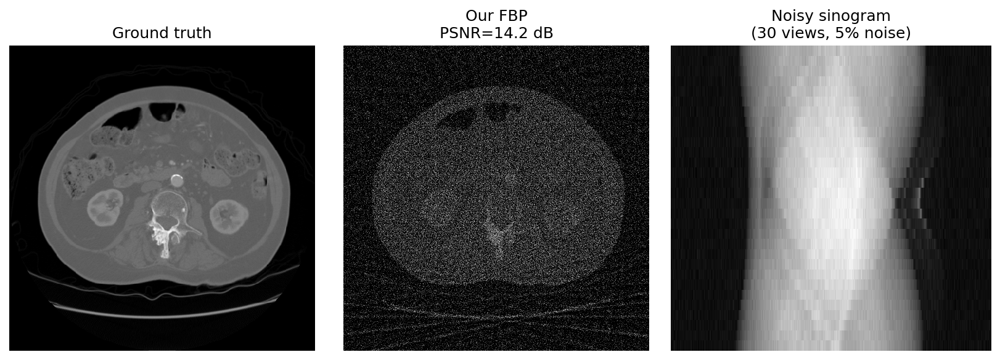

FBP PSNR: 14.21 dB


In [ ]:
def ramp_filter(sino):
    """
    Apply Ram-Lak filter in frequency domain.
    """
    # find sinogram shape to determine detector number
    n_det = sino.shape[-1]
    
    # compute frequency
    freqs = torch.fft.fftfreq(n_det, device=sino.device)
    
    # compute ramp filter
    ramp = torch.abs(freqs)
    
    # apply filter in frequency domain
    sino_fft = torch.fft.fft(sino, dim=-1)
    
    # apply ramp filter and inverse FFT
    return torch.fft.ifft(sino_fft * ramp, dim=-1).real

def fbp(sino, op, n_angles=30):
    """
    FBP: ramp filter → backproject → normalise → clamp.
    """
    # apply ramp filter
    sino_filtered = ramp_filter(sino)
    
    # backproject
    recon = op.adjoint(sino_filtered)
    
    # normalise by number of angles and π/2
    recon = recon * (np.pi / (2.0 * n_angles))
    
    # clamp to non-negative values
    return recon.clamp(min=0)

# generate sinogram
NOISE_STD = 0.05
sino_clean = op.forward(gt_t)
SCALE = sino_clean.max() / gt_t.max()
noise = NOISE_STD * (sino_clean / SCALE).std() * torch.randn_like(sino_clean)
sino_noisy = sino_clean / SCALE + noise
y = sino_noisy * SCALE

# reconstruct using FBP and scale to match ground truth
x_fbp = fbp(y, op)
x_fbp = ls_scale(gt_t, x_fbp).clamp(min=0)

# plot results
fig, axes = plt.subplots(1, 3, figsize=(11, 4))
gt_disp = gt_t[0].cpu().numpy()
axes[0].imshow(gt_disp); axes[0].set_title("Ground truth"); axes[0].axis("off")
axes[1].imshow(x_fbp[0].cpu().numpy(), vmin=gt_disp.min(), vmax=gt_disp.max())
axes[1].set_title(f"Our FBP\nPSNR={psnr(gt_t, x_fbp):.1f} dB"); axes[1].axis("off")

# Compare to ground truth sinogram
axes[2].imshow(sino_noisy[0].cpu().numpy(), aspect='auto')
axes[2].set_title(f"Noisy sinogram\n({N_VIEWS} views, {NOISE_STD*100:.0f}% noise)")
axes[2].axis("off")

plt.tight_layout()
plt.savefig(output_dir / "01_fbp_development.pdf", bbox_inches="tight")
plt.show()
print(f"FBP PSNR: {psnr(gt_t, x_fbp):.2f} dB")

### Moving FBP to the package

The `ramp_filter` and `fbp` functions are saved to `ct_tfpnp/ct_ops/fbp.py`.

In [77]:
from ct_tfpnp.ct_ops.fbp import fbp as lion_fbp

x_fbp_pkg = lion_fbp(y, op)
x_fbp_pkg = ls_scale(gt_t, x_fbp_pkg).clamp(min=0)

diff = (x_fbp - x_fbp_pkg).abs().max().item()
print(f"Max difference (inline vs package): {diff:.2e}")
print(f"✓ Package FBP matches inline implementation" if diff < 1e-6 else "✗ MISMATCH")

Max difference (inline vs package): 0.00e+00
✓ Package FBP matches inline implementation


/rds/user/eaz21/hpc-work/projects/tomosipo/tomosipo/links/torch.py:63: UserWarning: The parameter initial_value should be contiguous. It has been automatically made contiguous. Use `ts.link(x.contiguous())' to inhibit this warning. 
  warnings.warn(


### 5b. Confirming Streak Artefacts Are Expected

With only 30 views (vs the standard 720), the sinogram is severely undersampled angularly, causing streak artefacts in the FBP reconstruction, which are radial lines coming from high-contrast structures.

Below we compare 30-view (sparse) vs 180-view (dense) FBP to confirm that the artefacts come from angular undersampling, not from our FBP implementation. 

The 180-view reconstruction is near-perfect (33.8 dB), proving the operator and FBP work correctly. The 30-view reconstruction (22.9 dB) shows the streak artefacts that PnP-ADMM must remove.

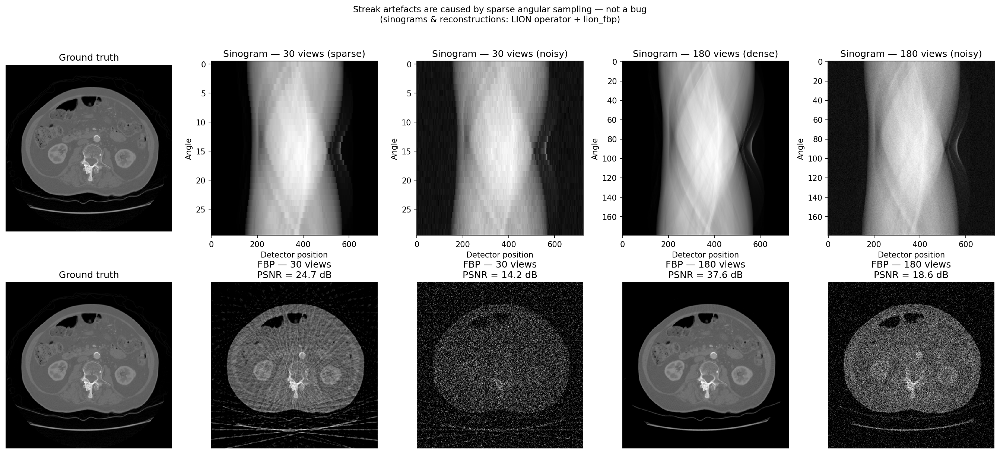

30-view FBP  : 24.69 dB  (streak artefacts — the problem PnP-ADMM solves)
30-view FBP  : 14.20 dB  (noise + streaks — very challenging)
180-view FBP : 37.61 dB  (near-perfect — confirms our FBP is correct)
180-view FBP : 18.59 dB  (noise only — much better than 30 views)


In [ ]:
# make full geometry
geometry_180 = Geometry(
    image_shape=image_shape,
    image_size=image_shape,
    detector_shape=[1, n_det],
    detector_size=[1, n_det],
    dso=IMG_SIZE * 2,
    dsd=IMG_SIZE * 4,
    mode="parallel",
    angles=np.linspace(0, np.pi, 180, endpoint=False),
)

# make full operator
op_180 = make_operator(geometry_180)

# make clean sinograms
sino_30_clean  = op.forward(gt_t)
sino_180_clean = op_180.forward(gt_t)

# make clean reconstructions
recon_30_clean  = lion_fbp(sino_30_clean, op, n_angles=30)
recon_180_clean = lion_fbp(sino_180_clean, op_180, n_angles=180)

# scale to match ground truth
recon_30_clean  = ls_scale(gt_t, recon_30_clean).clamp(min=0)
recon_180_clean = ls_scale(gt_t, recon_180_clean).clamp(min=0)

# compute PSNR for clean reconstructions
psnr_30_clean  = psnr(gt_t, recon_30_clean)
psnr_180_clean = psnr(gt_t, recon_180_clean)

# convert to numpy for plotting
gt_disp              = gt_t[0].cpu().numpy()
recon_30_disp_clean  = recon_30_clean[0].cpu().numpy()
recon_180_disp_clean = recon_180_clean[0].cpu().numpy()

# find scale fornoisy reconstructions
SCALE_30  = sino_30_clean.max() / gt_t.max()
SCALE_180 = sino_180_clean.max() / gt_t.max()

# set seed for reproducibility
torch.manual_seed(42)

# compute noise for sinograms
noise_30 = NOISE_STD * (sino_30_clean / SCALE_30).std() * torch.randn_like(sino_30_clean)
noise_180 = NOISE_STD * (sino_180_clean / SCALE_180).std() * torch.randn_like(sino_180_clean)

# compute noisy sinograms and reconstructions
sino_30_noisy  = sino_30_clean / SCALE_30 + noise_30
sino_180_noisy = sino_180_clean / SCALE_180 + noise_180

recon_30_noisy  = lion_fbp(sino_30_noisy, op, n_angles=30)
recon_180_noisy = lion_fbp(sino_180_noisy, op_180, n_angles=180)

recon_30_noisy  = ls_scale(gt_t, recon_30_noisy).clamp(min=0)
recon_180_noisy = ls_scale(gt_t, recon_180_noisy).clamp(min=0)

psnr_30_noisy  = psnr(gt_t, recon_30_noisy)
psnr_180_noisy = psnr(gt_t, recon_180_noisy)

gt_disp              = gt_t[0].cpu().numpy()
recon_30_disp_noisy  = recon_30_noisy[0].cpu().numpy()
recon_180_disp_noisy = recon_180_noisy[0].cpu().numpy()

# plot results
fig, axes = plt.subplots(2, 5, figsize=(18, 8))

axes[0, 0].imshow(gt_disp, vmin=gt_disp.min(), vmax=gt_disp.max())
axes[0, 0].set_title('Ground truth'); axes[0, 0].axis('off')

axes[0, 1].imshow(sino_30_clean[0].cpu().numpy(), aspect='auto')
axes[0, 1].set_title('Sinogram — 30 views (sparse)')
axes[0, 1].set_xlabel('Detector position'); axes[0, 1].set_ylabel('Angle')

axes[0, 2].imshow(sino_30_noisy[0].cpu().numpy(), aspect='auto')
axes[0, 2].set_title('Sinogram — 30 views (noisy)')
axes[0, 2].set_xlabel('Detector position'); axes[0, 2].set_ylabel('Angle')

axes[0, 3].imshow(sino_180_clean[0].cpu().numpy(), aspect='auto')
axes[0, 3].set_title('Sinogram — 180 views (dense)')
axes[0, 3].set_xlabel('Detector position'); axes[0, 3].set_ylabel('Angle')

axes[0, 4].imshow(sino_180_noisy[0].cpu().numpy(), aspect='auto')
axes[0, 4].set_title('Sinogram — 180 views (noisy)')
axes[0, 4].set_xlabel('Detector position'); axes[0, 4].set_ylabel('Angle')

axes[1, 0].imshow(gt_disp, vmin=gt_disp.min(), vmax=gt_disp.max())
axes[1, 0].set_title('Ground truth'); axes[1, 0].axis('off')

axes[1, 1].imshow(recon_30_disp_clean, vmin=gt_disp.min(), vmax=gt_disp.max())
axes[1, 1].set_title(f'FBP — 30 views\nPSNR = {psnr_30_clean:.1f} dB'); axes[1, 1].axis('off')

axes[1, 2].imshow(recon_30_disp_noisy, vmin=gt_disp.min(), vmax=gt_disp.max())
axes[1, 2].set_title(f'FBP — 30 views\nPSNR = {psnr_30_noisy    :.1f} dB'); axes[1, 2].axis('off')

axes[1, 3].imshow(recon_180_disp_clean, vmin=gt_disp.min(), vmax=gt_disp.max())
axes[1, 3].set_title(f'FBP — 180 views\nPSNR = {psnr_180_clean    :.1f} dB'); axes[1, 3].axis('off')

axes[1, 4].imshow(recon_180_disp_noisy, vmin=gt_disp.min(), vmax=gt_disp.max())
axes[1, 4].set_title(f'FBP — 180 views\nPSNR = {psnr_180_noisy    :.1f} dB'); axes[1, 4].axis('off')

plt.suptitle('Streak artefacts are caused by sparse angular sampling — not a bug\n'
             '(sinograms & reconstructions: LION operator + lion_fbp)', y=1.02, fontsize=11)

plt.tight_layout()
plt.savefig(output_dir / '02_sparse_vs_full.pdf', bbox_inches='tight')
plt.show()

# print PSNR values for clarity
print(f'30-view FBP  : {psnr_30_clean:.2f} dB  (streak artefacts — the problem PnP-ADMM solves)')
print(f'30-view FBP  : {psnr_30_noisy:.2f} dB  (noise + streaks — very challenging)')
print(f'180-view FBP : {psnr_180_clean:.2f} dB  (near-perfect — confirms our FBP is correct)')
print(f'180-view FBP : {psnr_180_noisy:.2f} dB  (noise only — much better than 30 views)')

## 6. TV Reconstruction Development

Total Variation minimisation is a classical regularisation baseline solving:

$$\min_x \frac{1}{2}\|Ax - y\|^2 + \lambda \cdot \text{TV}(x)$$

using proximal gradient descent. 

Each iteration applies a data-fidelity gradient step followed by a TV proximal step (soft-thresholding of image gradients).

TV serves as a baseline between FBP (no regularisation) and learned methods (PnP-ADMM, TFPnP).

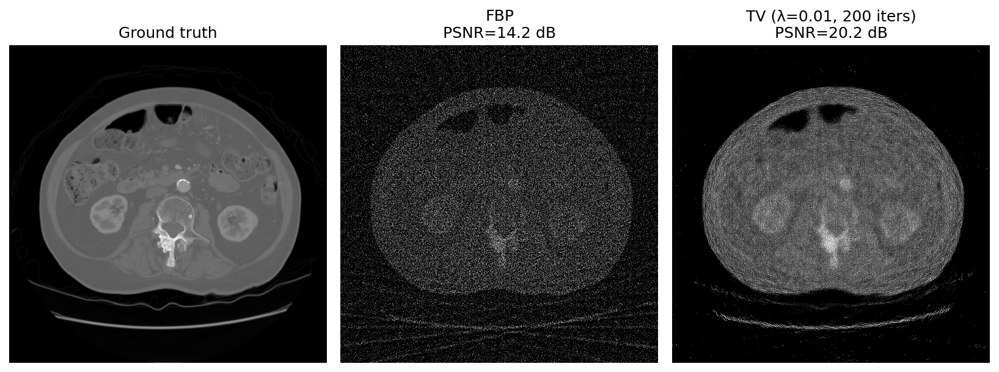

In [ ]:
def _tv_proximal(x, lam):
    """
    Proximal operator for anisotropic TV via soft-thresholding.
    """
    # find differences along x and y axes
    dx = x[..., :, 1:] - x[..., :, :-1]
    dy = x[..., 1:, :] - x[..., :-1, :]

    # apply soft-thresholding
    dx = torch.sign(dx) * torch.clamp(dx.abs() - lam, min=0)
    dy = torch.sign(dy) * torch.clamp(dy.abs() - lam, min=0)

    # compute divergence of the thresholded differences
    div = torch.zeros_like(x)
    div[..., :, 1:]  += dx; div[..., :, :-1] -= dx
    div[..., 1:, :]  += dy; div[..., :-1, :] -= dy

    # return updated image
    return x + lam * div

def tv_reconstruction(y, op, x0=None, lam=0.01, step_size=0.1, n_iters=200):
    """
    TV-regularised CT reconstruction via proximal gradient descent.
    """
    # initialize x with x0 or zeros
    x = x0.clone() if x0 is not None else torch.zeros_like(y)
    
    with torch.no_grad():
        for k in range(n_iters):

            # find residual and gradient
            residual = op.forward(x) - y
            grad = op.adjoint(residual)
            grad = grad / (grad.abs().max() + 1e-8)

            # gradient descent step 
            x = x - step_size * grad

            # TV proximal operator
            x = _tv_proximal(x, lam * step_size)

            # clamp to non-negative values
            x = x.clamp(min=0)

    return x

# test
x_tv = tv_reconstruction(y, op, x0=x_fbp, lam=0.01, n_iters=200)
x_tv_scaled = ls_scale(gt_t, x_tv).clamp(min=0)

# plot results
fig, axes = plt.subplots(1, 3, figsize=(11, 4))

axes[0].imshow(gt_disp); axes[0].set_title("Ground truth"); axes[0].axis("off")

axes[1].imshow(x_fbp[0].cpu().numpy(), vmin=gt_disp.min(), vmax=gt_disp.max())
axes[1].set_title(f"FBP\nPSNR={psnr(gt_t, x_fbp):.1f} dB"); axes[1].axis("off")

axes[2].imshow(x_tv_scaled[0].cpu().numpy(), vmin=gt_disp.min(), vmax=gt_disp.max())
axes[2].set_title(f"TV (λ=0.01, 200 iters)\nPSNR={psnr(gt_t, x_tv_scaled):.1f} dB"); axes[2].axis("off")

plt.tight_layout()
plt.savefig(output_dir / "03_tv_development.pdf", bbox_inches="tight")
plt.show()

### Moving TV to the package

Saved to `ct_tfpnp/ct_ops/tv.py`.

In [ ]:
from ct_tfpnp.ct_ops.tv import tv_reconstruction as tv_pkg

# test package version
x_tv_pkg = tv_pkg(y, op, x0=x_fbp, lam=0.01, n_iters=200)
x_tv_pkg_s = ls_scale(gt_t, x_tv_pkg).clamp(min=0)

print(f"Package TV PSNR: {psnr(gt_t, x_tv_pkg_s):.2f} dB")
print("✓ TV reconstruction verified from package")

Package TV PSNR: 20.18 dB
✓ TV reconstruction verified from package


## 7. The Denoiser: DRUNet

In PnP-ADMM, the x-step applies a denoiser $H_{\sigma}$ to enforce an image prior, with the choice of denoiser directly affecting reconstruction quality.

Tis project uses DRUNet (Zhang et al. 2021), a pretrained denoiser from the KAIR repository that is:

- Pretrained on natural images (BSD + Waterloo + DIV2K), not CT-specific
- Takes $\sigma$ as an explicit input through a noise-level map
- Differentiable w.r.t. $\sigma$, critical for the model-based $\pi_2$ policy update

Using an off-the-shelf denoiser (rather than training our own) demonstrates that TFPnP generalises to different denoisers

The DRUNet is developed and validated in detail in Notebook 07, including:

- Architecture verification
- Systematic Gaussian denoising across σ ∈ {1, 2, 5, 10, 15, 25, 50}

See `ct_tfpnp/models/denoiser.py` for the implementation.

In [ ]:
from ct_tfpnp.models.denoiser import DRUNetDenoiser

# set denoiser path
DENOISER_PATH = "/home/eaz21/rds/hpc-work/eaz21/results/baselines/drunet_gray.pth"

# load DRUNet denoiser
denoiser = DRUNetDenoiser(pretrained_path=DENOISER_PATH).to(device)
for p in denoiser.parameters():
    p.requires_grad_(False)
denoiser.eval()

# denoise at σ=2.0
with torch.no_grad():
    x_den = denoiser(x_fbp, sigma=2.0)
x_den_s = ls_scale(gt_t, x_den).clamp(min=0)

print(f"DRUNet denoised (σ=2): PSNR = {psnr(gt_t, x_den_s):.2f} dB  (FBP was {psnr(gt_t, x_fbp):.2f} dB)")
print("✓ DRUNet loaded and working")

Loaded DRUNet weights from /home/eaz21/rds/hpc-work/eaz21/results/baselines/drunet_gray.pth
DRUNet denoised (σ=2): PSNR = 14.42 dB  (FBP was 14.21 dB)
✓ DRUNet loaded and working


### DRUNet σ sweep

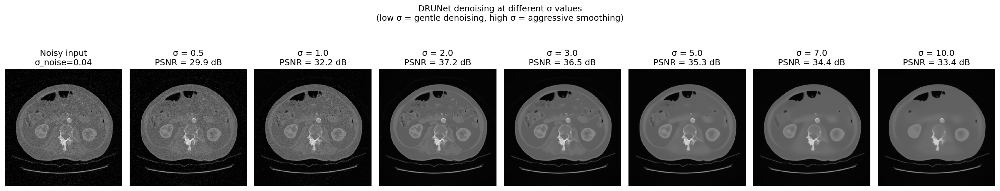

Key: σ controls denoising strength. The policy must learn what σ to use.
For CT with DRUNet, σ=1–5 preserves detail; σ>10 over-smooths.


In [ ]:
# set σ values to test
sigmas_show = [0.5, 1.0, 2.0, 3.0, 5.0, 7.0, 10.0]

# normalise ground truth to [0, 1] for display
gt_max = gt_t.max()
gt_01 = gt_t / gt_max

# Add light noise so denoising is visible
torch.manual_seed(42)
gt_noisy = (gt_01 + 0.04 * torch.randn_like(gt_01)).clamp(min=0)

# plot denoising results for different σ values
fig, axes = plt.subplots(1, len(sigmas_show) + 1, figsize=(20, 4))
axes[0].imshow(gt_noisy[0].cpu().numpy(), vmin=0, vmax=1)
axes[0].set_title('Noisy input\nσ_noise=0.04'); axes[0].axis('off')

for i, sig in enumerate(sigmas_show):
    with torch.no_grad():
        d = denoiser(gt_noisy * gt_max, sigma=float(sig))
    d_01 = d / gt_max
    axes[i+1].imshow(d_01[0].cpu().numpy(), vmin=0, vmax=1)
    axes[i+1].set_title(f'σ = {sig}\nPSNR = {psnr(gt_01, d_01):.1f} dB'); axes[i+1].axis('off')

plt.suptitle('DRUNet denoising at different σ values\n'
             '(low σ = gentle denoising, high σ = aggressive smoothing)',
             y=1.05, fontsize=12)
plt.tight_layout()
plt.savefig(output_dir / '04_drunet_sigma_sweep.pdf', bbox_inches='tight')
plt.show()

print("Key: σ controls denoising strength. The policy must learn what σ to use.")
print("For CT with DRUNet, σ=1–5 preserves detail; σ>10 over-smooths.")

## 8. ADMM Step Development

### Why we need a custom ADMMStep

LION provides iterative reconstruction methods, but does not include a PnP-ADMM implementation that matches the TFPnP paper's specific requirements.

1. The paper uses x for the denoiser variable and z for the data fidelity variable.

2. The z-step must be differentiable w.r.t. $\mu$ for the model-based $\pi_2$ update (eq. 17).

3. LION's adjoint operator `op.adjoint()` is unscaled, so the gradient must be normalised.

4. The step takes $(\sigma, \mu)$ as explicit inputs, allowing the RL policy to control them adaptively.

### The three sub-steps (equations 7–9)

$$x^{k+1} = \mathcal{H}_\sigma(z^k - u^k) \quad \text{(x-step: apply denoiser to } z-u\text{)}$$

$$z^{k+1} = \arg\min_z \frac{1}{2}\|Az - y\|^2 + \frac{\mu}{2}\|z - (x^{k+1} + u^k)\|^2 \quad \text{(z-step: data fidelity via GD)}$$

$$u^{k+1} = u^k + x^{k+1} - z^{k+1} \quad \text{(u-step: accumulate constraint violation)}$$

In [ ]:
class ADMMStep(nn.Module):
    """
    One full ADMM iteration following TFPnP paper convention.
    """
    def __init__(self, op, denoiser, n_x_steps=6, x_lr=1.0):
        super().__init__()
        self.op = op
        self.denoiser = denoiser
        self.n_x_steps = n_x_steps
        self.x_lr = x_lr

    def x_step(self, z, u, sigma):
        """
        x = H_σ(z - u): apply denoiser to enforce image prior.
        """
        return self.denoiser(z - u, sigma)

    def z_step(self, x, u, y, mu):
        """
        Minimise ||Az-y||² + μ||z-(x+u)||² via 6 steps of GD.
        """
        # set target and initial z
        target = x + u
        z = x.clone()

        # set learning rate for z-step
        lr = self.x_lr / (1.0 + mu)

        for _ in range(self.n_x_steps):

            # compute residual
            residual = self.op.forward(z) - y
            
            # backproject residual and normalise
            ATres = self.op.adjoint(residual)
            ATres = ATres / (ATres.abs().max() + 1e-8)
            
            # compute gradient
            grad = ATres + mu * (z - target)
            
            # update z
            z = z - lr * grad

        return z

    def u_step(self, u, x, z):
        """
        u = u + x - z: accumulate constraint violation.
        """
        return u + x - z

    def forward(self, x, z, u, y, sigma, mu):
        x_new = self.x_step(z, u, sigma)
        z_new = self.z_step(x_new, u, y, mu)
        u_new = self.u_step(u, x_new, z_new)
        return x_new, z_new, u_new

# Test with DRUNet
admm = ADMMStep(op=op, denoiser=denoiser, n_x_steps=6)

# set initial values for x, z, u
x, z, u = x_fbp.clone(), x_fbp.clone(), torch.zeros_like(x_fbp)

# record PSNR history
psnr_hist = [psnr(gt_t, x)]

# run 20 iterations of ADMM and record PSNR
with torch.no_grad():
    for k in range(20):
        x, z, u = admm(x, z, u, y, sigma=2.0, mu=10.0)
        psnr_hist.append(psnr(gt_t, x))

# scale final reconstruction to match ground truth
x_admm_s = ls_scale(gt_t, x).clamp(min=0)

print(f"FBP:              {psnr(gt_t, x_fbp):.2f} dB")
print(f"After 20 iters:   {psnr(gt_t, x_admm_s):.2f} dB")
print("✓ ADMMStep works — PSNR improves over FBP")

FBP:              14.21 dB
After 20 iters:   27.59 dB
✓ ADMMStep works — PSNR improves over FBP


### Moving ADMM to the package

Saved to `ct_tfpnp/ct_ops/admm.py`.

In [ ]:
from ct_tfpnp.ct_ops.admm import ADMMStep as ADMMStep_pkg

admm_step = ADMMStep_pkg(op=op, denoiser=denoiser, n_x_steps=6)

x2, z2, u2 = x_fbp.clone(), x_fbp.clone(), torch.zeros_like(x_fbp)

with torch.no_grad():
    for k in range(20):
        x2, z2, u2 = admm_step(x2, z2, u2, y, sigma=2.0, mu=10.0)
        
x2_s = ls_scale(gt_t, x2).clamp(min=0)

print(f"Inline ADMM:  PSNR = {psnr(gt_t, x_admm_s):.2f} dB")
print(f"Package ADMM: PSNR = {psnr(gt_t, x2_s):.2f} dB")
print("✓ Package ADMM matches inline implementation")

Inline ADMM:  PSNR = 27.59 dB
Package ADMM: PSNR = 27.59 dB
✓ Package ADMM matches inline implementation


### Adding a helper to run PnP-ADMM and collect PSNR history

In [ ]:
def run_pnp_admm(y, gt, admm_step, x_init, sigma=2.0, mu=10.0, max_iter=200):
    """
    Run PnP-ADMM with fixed σ, μ and return (psnr_history, best_recon).
    """
    # initialise x, z, u and PSNR history
    x = x_init.clone(); z = x_init.clone(); u = torch.zeros_like(x_init)
    psnr_hist = [psnr(gt, ls_scale(gt, x).clamp(min=0))]
    best_psnr = psnr_hist[0]; best_recon = x.clone()
    
    with torch.no_grad():
        for k in range(max_iter):

            # perform one ADMM step
            x, z, u = admm_step(x, z, u, y, sigma=sigma, mu=mu)

            # rescale
            x_s = ls_scale(gt, x).clamp(min=0)

            # compute PSNR
            p = psnr(gt, x_s)
            
            # update PSNR history
            psnr_hist.append(p)
            if p > best_psnr:
                best_psnr = p; best_recon = x_s.clone()

    return psnr_hist, best_recon

def run_pnp_admm_scheduled(y, gt, admm_step, x_init, sigma_schedule, mu=10.0, max_iter=20):
    """
    Run PnP-ADMM with a σ schedule (list or callable).
    """
    x = x_init.clone(); z = x_init.clone(); u = torch.zeros_like(x_init)
    psnr_hist = [psnr(gt, ls_scale(gt, x).clamp(min=0))]
    sig_hist = []
    
    with torch.no_grad():
        for k in range(max_iter):

            # determine σ for this iteration
            sig = sigma_schedule(k) if callable(sigma_schedule) else sigma_schedule[min(k, len(sigma_schedule)-1)]
            
            # perform one ADMM step and record PSNR
            x, z, u = admm_step(x, z, u, y, sigma=sig, mu=mu)
            x_s = ls_scale(gt, x).clamp(min=0)
            psnr_hist.append(psnr(gt, x_s))
            sig_hist.append(sig)

    return psnr_hist, sig_hist

# Updated defaults
SIGMA_DEFAULT = 1.5  
MU_DEFAULT = 20.0    

# find baseline FBP PSNR for comparison
fbp_psnr = psnr(gt_t, x_fbp)
gt_np = gt_t[0].cpu().numpy()
print(f"Defaults: σ={SIGMA_DEFAULT}, μ={MU_DEFAULT}")
print(f"FBP baseline: {fbp_psnr:.2f} dB")

Defaults: σ=2.0, μ=20.0
FBP baseline: 14.21 dB


### ADMM step visualisation

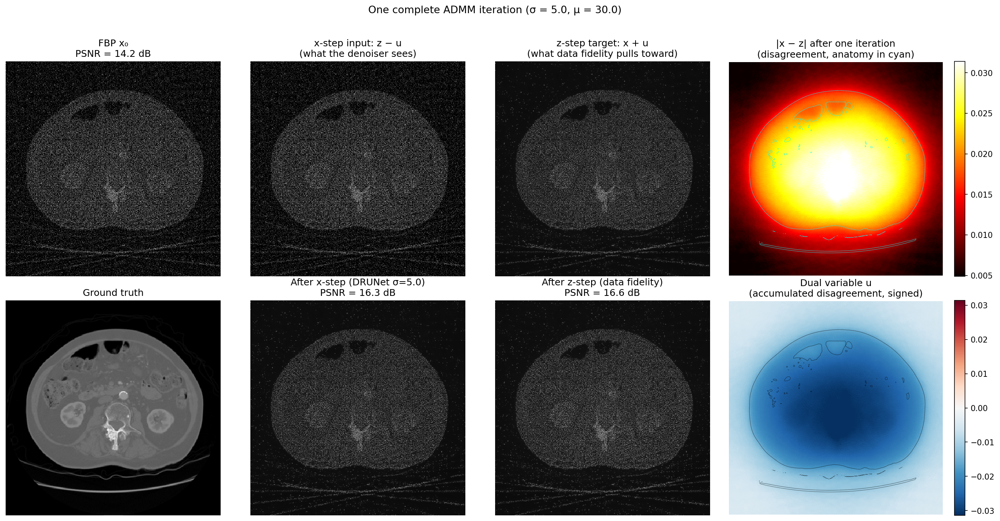

In [ ]:
# set hgih params to better visualise effect of one iteration
sigma_vis, mu_vis = 5.0, 30.0

# initialise ADMM variables from FBP starting point
x_vis = x_fbp.clone()
z_vis = x_fbp.clone()
u_vis = torch.zeros_like(x_fbp)

# run one full sweep of three steps
with torch.no_grad():

    # denosing step
    x_new = admm_step.x_step(z_vis, u_vis, sigma_vis)

    # GD pulls toward sinogram
    z_new = admm_step.z_step(x_new, u_vis, y, mu_vis) 

    # accumulate dual variable
    u_new = admm_step.u_step(u_vis, x_new, z_new)   

# find constraint violation
cv = (x_new - z_new).abs()


# plot the results
fig, axes = plt.subplots(2, 4, figsize=(18, 9))
vmin, vmax = gt_disp.min(), gt_disp.max()

# convert tensors to numpy and clip
cv_np   = cv[0].cpu().numpy()
u_np    = u_new[0].cpu().numpy()
cv_clip = np.percentile(cv_np,   [2, 98])
u_clip  = np.percentile(np.abs(u_np), 98)

# find contour level for ground truth
gt_np = gt_disp if isinstance(gt_disp, np.ndarray) else gt_disp.cpu().numpy()
contour_level = 0.3 * gt_np.max()

# show starting point
axes[0, 0].imshow(x_fbp[0].cpu().numpy(), vmin=vmin, vmax=vmax)
axes[0, 0].set_title(f"FBP x₀\nPSNR = {psnr(gt_t, x_fbp):.1f} dB")
axes[0, 0].axis("off")

# current z-u
axes[0, 1].imshow((z_vis - u_vis)[0].cpu().numpy(), vmin=vmin, vmax=vmax)
axes[0, 1].set_title("x-step input: z − u\n(what the denoiser sees)")
axes[0, 1].axis("off")

# new x+u
axes[0, 2].imshow((x_new + u_vis)[0].cpu().numpy(), vmin=vmin, vmax=vmax)
axes[0, 2].set_title("z-step target: x + u\n(what data fidelity pulls toward)")
axes[0, 2].axis("off")

# disgreement between prior and data
im1 = axes[0, 3].imshow(cv_np, cmap="hot", vmin=cv_clip[0], vmax=cv_clip[1])
axes[0, 3].contour(gt_np, levels=[contour_level], colors="cyan", linewidths=0.5, alpha=0.7)
axes[0, 3].set_title("|x − z| after one iteration\n(disagreement, anatomy in cyan)")
axes[0, 3].axis("off")
plt.colorbar(im1, ax=axes[0, 3], fraction=0.046)

# ground truth
axes[1, 0].imshow(gt_np, vmin=vmin, vmax=vmax)
axes[1, 0].set_title("Ground truth")
axes[1, 0].axis("off")

# result of x-step
x_new_s = ls_scale(gt_t, x_new).clamp(min=0)
axes[1, 1].imshow(x_new[0].cpu().numpy(), vmin=vmin, vmax=vmax)
axes[1, 1].set_title(f"After x-step (DRUNet σ={sigma_vis})\n"
                     f"PSNR = {psnr(gt_t, x_new_s):.1f} dB")
axes[1, 1].axis("off")

# result of z-step
z_new_s = ls_scale(gt_t, z_new).clamp(min=0)
axes[1, 2].imshow(z_new[0].cpu().numpy(), vmin=vmin, vmax=vmax)
axes[1, 2].set_title(f"After z-step (data fidelity)\n"
                     f"PSNR = {psnr(gt_t, z_new_s):.1f} dB")
axes[1, 2].axis("off")

# updated u 
im2 = axes[1, 3].imshow(u_np, cmap="RdBu_r", vmin=-u_clip, vmax=u_clip)
axes[1, 3].contour(gt_np, levels=[contour_level], colors="black", linewidths=0.5, alpha=0.5)
axes[1, 3].set_title("Dual variable u\n(accumulated disagreement, signed)")
axes[1, 3].axis("off")
plt.colorbar(im2, ax=axes[1, 3], fraction=0.046)

plt.suptitle(f"One complete ADMM iteration (σ = {sigma_vis}, µ = {mu_vis})", y=1.02, fontsize=13)
plt.tight_layout()
plt.savefig(output_dir / "05_admm_one_iteration.pdf", bbox_inches="tight")
plt.show()

### What this figure shows

The ADMM algorithm alternates between two competing objectives at each iteration.

The top row shows the inputs to each stage:

- The FBP starting point.
- z − u is what the denoiser receives.
- x + u is the target for the data fidelity step, as the z-step tries to find an image that both matches the sinogram measurements and stays close to this target.
- |x − z| is the disagreement between the denoiser's output (x) and the data fidelity solution (z).

The bottom row shows the outputs:

- After the x-step (DRUNet) the denoiser smooths out noise and artefacts, and the image looks cleaner but some fine detail may be lost.
- After the z-step (data fidelity) the gradient descent pulls the image back toward consistency with the sinogram.
- The dual variable u accumulates the running disagreement between x and z. 

The denoiser wants a smooth image (high PSNR, fewer artefacts) while the data fidelity wants an image consistent with the measurements (which contain artefacts from sparse sampling), and ADMM balances the two. 

The parameters $\sigma$ (how strongly to denoise) and $\mu$ (how much to trust the data) control this balance.

## 9. Running the Full PnP-ADMM Loop

Before analysing parameter sensitivity, we want to verify that PnP-ADMM with DRUNet produces a meaningful reconstruction, checking that:

1. PSNR improves over FBP baseline
2. The convergence curve is reasonable
3. Visual quality is acceptable

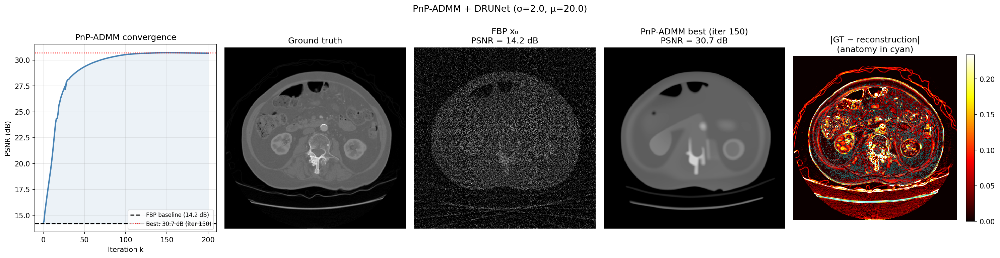

In [ ]:
# run full pnp-admm and record PSNR history
hist_full, x_best = run_pnp_admm(y, gt_t, admm_step, x_fbp, sigma=SIGMA_DEFAULT, mu=MU_DEFAULT, max_iter=200)

# find best iteration and PSNR
best_iter   = int(np.argmax(hist_full))
best_psnr   = float(max(hist_full))

# convert best reconstruction to numpy for display
x_best_disp = x_best[0].cpu().numpy()

# convert ground truth and FBP to numpy for display
gt_np  = gt_disp if isinstance(gt_disp, np.ndarray) else gt_disp.cpu().numpy()
fbp_np = x_fbp[0].cpu().numpy()

# rescale to match gt
x_best_scaled = ls_scale(gt_t, x_best).clamp(min=0)[0].cpu().numpy()

# find difference between gt and recon, then clip
diff      = np.abs(gt_np - x_best_scaled)
diff_clip = np.percentile(diff, [2, 98])

# plot results
fig, axes = plt.subplots(1, 5, figsize=(20, 5))

axes[0].plot(hist_full, color="C0", lw=2)
axes[0].axhline(fbp_psnr, color="k", ls="--", lw=1.5, label=f"FBP baseline ({fbp_psnr:.1f} dB)")
axes[0].axhline(best_psnr, color="C2", ls=":",  lw=1.2, label=f"Best: {best_psnr:.1f} dB (iter {best_iter})")

# shade the region of improvement over FBP
axes[0].fill_between(range(len(hist_full)), fbp_psnr, hist_full, where=np.array(hist_full) > fbp_psnr, color="C0", alpha=0.1)

axes[0].set_xlabel("Iteration k")
axes[0].set_ylabel("PSNR (dB)")
axes[0].set_title("PnP-ADMM convergence")
axes[0].legend(fontsize=8, loc="lower right")
axes[0].grid(True, alpha=0.3)
axes[0].margins(y=0.05)

# plot reconstrruction comparisons
vmin, vmax = gt_np.min(), gt_np.max()

axes[1].imshow(gt_np, vmin=vmin, vmax=vmax, cmap="gray")
axes[1].set_title("Ground truth"); axes[1].axis("off")

axes[2].imshow(fbp_np, vmin=vmin, vmax=vmax, cmap="gray")
axes[2].set_title(f"FBP x₀\nPSNR = {fbp_psnr:.1f} dB"); axes[2].axis("off")

axes[3].imshow(x_best_scaled, vmin=vmin, vmax=vmax, cmap="gray")
axes[3].set_title(f"PnP-ADMM best (iter {best_iter})\nPSNR = {best_psnr:.1f} dB")
axes[3].axis("off")

# plot residual
im = axes[4].imshow(diff, cmap="hot", vmin=diff_clip[0], vmax=diff_clip[1])

# set 3 contour levels for clearer anatomy visualisation
levels = np.percentile(gt_np[gt_np > 0.05], [50, 80, 95]) 

axes[4].contour(gt_np, levels=levels, colors="cyan", linewidths=0.4, alpha=0.45)           
axes[4].set_title("|GT − reconstruction|\n(anatomy in cyan)")
axes[4].axis("off")

plt.colorbar(im, ax=axes[4], fraction=0.046)

plt.suptitle(f"PnP-ADMM + DRUNet (σ={SIGMA_DEFAULT}, µ={MU_DEFAULT})", y=1.02, fontsize=13)
plt.tight_layout()
plt.savefig(output_dir / "06_pnp_admm_convergence.pdf", bbox_inches="tight")
plt.show()

# print warning if best PSNR occurs at final iteration
if best_iter == len(hist_full) - 1:
    print(f"Note: best PSNR occurred at the final iteration ({best_iter}). "
          f"The curve may still be improving — consider increasing max_iter.")

## 10. σ sensitivity: the core problem

The denoiser strength σ controls how aggressively the x-step smooths the image. Too small and noise/artefacts persist, too large and fine anatomical detail is destroyed.

The key question is what value of $\sigma$ should we use, as there is no principled way to choose it without access to the ground truth. 

Sweeping $\sigma$ across a grid and recording the PSNR at each iteration can produce a visualisation of the optimal values to use in our implementation.

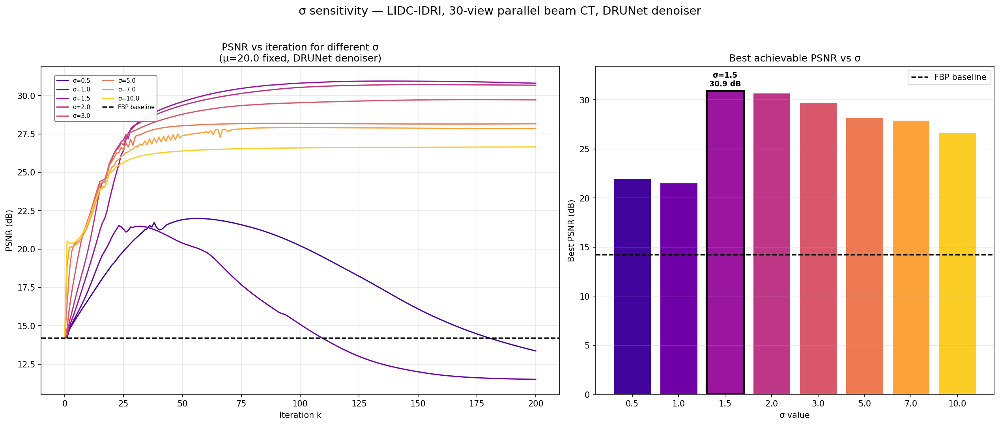

PSNR range: 21.53 – 30.94 dB
Best σ = 1.5  (PSNR = 30.94 dB)


In [ ]:
# set sweep grid
sigmas_grid = [0.5, 1.0, 1.5, 2.0, 3.0, 5.0, 7.0, 10.0] 

colours = plt.cm.plasma(np.linspace(0.1, 0.9, len(sigmas_grid)))

fig, axes = plt.subplots(1, 2, figsize=(17, 7), gridspec_kw={'width_ratios': [1.3, 1]})

best_psnr_per_sigma = []

for sig, col in zip(sigmas_grid, colours):

    # run pnp-admm and record PSNR history
    hist, _ = run_pnp_admm(y, gt_t, admm_step, x_fbp, sigma=sig, mu=MU_DEFAULT)
    axes[0].plot(hist, color=col, lw=1.5, label=f'σ={sig}')
    best_psnr_per_sigma.append(max(hist))

# plot PSNR vs iteration for different σ values
axes[0].axhline(fbp_psnr, color='k', ls='--', lw=1.5, label='FBP baseline')
axes[0].set_xlabel('Iteration k')
axes[0].set_ylabel('PSNR (dB)')
axes[0].set_title(f'PSNR vs iteration for different σ\n(μ={MU_DEFAULT} fixed, DRUNet denoiser)')
axes[0].legend(fontsize=7, ncol=2, bbox_to_anchor=(0.02, 0.98), loc='upper left', framealpha=0.95, edgecolor='grey')
axes[0].grid(True, alpha=0.3)

best_idx = np.argmax(best_psnr_per_sigma)
best_sig = sigmas_grid[best_idx]

# plot best PSNR vs σ
bars = axes[1].bar(range(len(sigmas_grid)), best_psnr_per_sigma, color=[colours[i] for i in range(len(sigmas_grid))], edgecolor='white', linewidth=0.5)
bars[best_idx].set_edgecolor('black')
bars[best_idx].set_linewidth(2.5)

axes[1].axhline(fbp_psnr, color='k', ls='--', lw=1.5, label='FBP baseline')
axes[1].text(best_idx, best_psnr_per_sigma[best_idx] + 0.3, f'σ={best_sig}\n{best_psnr_per_sigma[best_idx]:.1f} dB', ha='center', va='bottom', fontsize=9, fontweight='bold')
axes[1].set_xticks(range(len(sigmas_grid)))
axes[1].set_xticklabels([f'{s}' for s in sigmas_grid])
axes[1].set_xlabel('σ value'); axes[1].set_ylabel('Best PSNR (dB)')
axes[1].set_title('Best achievable PSNR vs σ')
axes[1].legend(); axes[1].grid(True, alpha=0.3, axis='y')
axes[1].set_ylim(0, max(best_psnr_per_sigma) + 2.5)

plt.suptitle('σ sensitivity — LIDC-IDRI, 30-view parallel beam CT, DRUNet denoiser', y=1.02, fontsize=14)
plt.tight_layout()
plt.savefig(output_dir / '07_sigma_sensitivity.pdf', bbox_inches='tight')
plt.show()

# print summary of σ sweep
print(f'PSNR range: {min(best_psnr_per_sigma):.2f} – {max(best_psnr_per_sigma):.2f} dB')
print(f'Best σ = {best_sig}  (PSNR = {max(best_psnr_per_sigma):.2f} dB)')

The σ=0.5 and σ=1.0 curves illustrate the central problem this project addresses, showing that with insufficient denoising strength, PnP-ADMM initially improves but then accumulates noise and streak artefacts, eventually falling below the FBP starting point. 

## 11. μ sensitivity

The penalty parameter $\mu$ in ADMM controls how tightly the denoiser output x and the data-fidelity solution z are coupled. In the z-step update:

$$z^{(k+1)} = \arg\min_z \; \|Az - y\|^2 + \mu\|z - (x^{(k+1)} + u^{(k)})\|^2$$

- If it is too small, the data-fidelity term dominates, z is pulled toward a noisy/streaky solution, and the algorithm diverges.
- If it is too large, the proximity term dominates, and the sinogram data is effectively ignored.

Like $\sigma$, the optimal $\mu$ depends on the image, noise level, and iteration, and is another parameter that TFPnP learns to adapt.

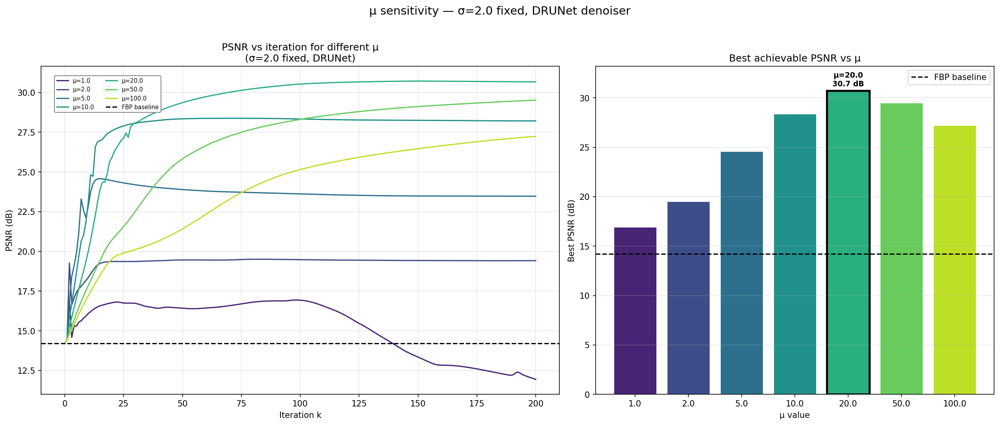

PSNR range: 16.94 – 30.72 dB
Best μ = 20.0  (PSNR = 30.72 dB)


In [ ]:
# set sweep grid for μ values
mus_grid = [1.0, 2.0, 5.0, 10.0, 20.0, 50.0, 100.0]

colours_mu = plt.cm.viridis(np.linspace(0.1, 0.9, len(mus_grid)))

fig, axes = plt.subplots(1, 2, figsize=(17, 7), gridspec_kw={'width_ratios': [1.3, 1]})

best_psnr_per_mu = []

for mu, col in zip(mus_grid, colours_mu):
    hist, _ = run_pnp_admm(y, gt_t, admm_step, x_fbp, sigma=SIGMA_DEFAULT, mu=mu, )
    axes[0].plot(hist, color=col, lw=1.5, label=f'μ={mu}')
    best_psnr_per_mu.append(max(hist))

axes[0].axhline(fbp_psnr, color='k', ls='--', lw=1.5, label='FBP baseline')
axes[0].set_xlabel('Iteration k'); axes[0].set_ylabel('PSNR (dB)')
axes[0].set_title(f'PSNR vs iteration for different μ\n(σ={SIGMA_DEFAULT} fixed, DRUNet)')
axes[0].legend(fontsize=7, ncol=2, bbox_to_anchor=(0.02, 0.98), loc='upper left', framealpha=0.95, edgecolor='grey')
axes[0].grid(True, alpha=0.3)

best_idx = np.argmax(best_psnr_per_mu)
best_mu = mus_grid[best_idx]

bars = axes[1].bar(range(len(mus_grid)), best_psnr_per_mu, color=[colours_mu[i] for i in range(len(mus_grid))], edgecolor='white', linewidth=0.5)
bars[best_idx].set_edgecolor('black'); bars[best_idx].set_linewidth(2.5)
axes[1].axhline(fbp_psnr, color='k', ls='--', lw=1.5, label='FBP baseline')
axes[1].text(best_idx, best_psnr_per_mu[best_idx] + 0.3, f'μ={best_mu}\n{best_psnr_per_mu[best_idx]:.1f} dB', ha='center', va='bottom', fontsize=9, fontweight='bold')
axes[1].set_xticks(range(len(mus_grid)))
axes[1].set_xticklabels([f'{m}' for m in mus_grid])
axes[1].set_xlabel('μ value'); axes[1].set_ylabel('Best PSNR (dB)')
axes[1].set_title('Best achievable PSNR vs μ')
axes[1].legend(); axes[1].grid(True, alpha=0.3, axis='y')
axes[1].set_ylim(0, max(best_psnr_per_mu) + 2.5)

plt.suptitle(f'μ sensitivity — σ={SIGMA_DEFAULT} fixed, DRUNet denoiser', y=1.02, fontsize=14)
plt.tight_layout()
plt.savefig(output_dir / '08_mu_sensitivity.pdf', bbox_inches='tight')
plt.show()

print(f'PSNR range: {min(best_psnr_per_mu):.2f} – {max(best_psnr_per_mu):.2f} dB')
print(f'Best μ = {best_mu}  (PSNR = {max(best_psnr_per_mu):.2f} dB)')

## 12. The value of early stopping

For many parameter settings, PSNR is non-monotone, peaking at some iteration k and then decreasing as the algorithm continues. Running beyond k actively degrades the reconstruction.

The practical consequence is that even if we knew the perfect $\sigma$ and $\mu$, we would still need to know when to stop, which is the role of TFPnP's discrete action.

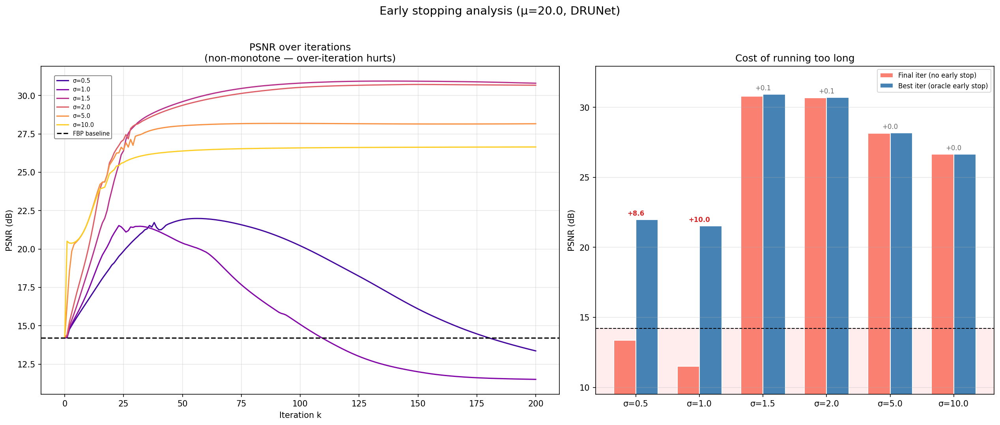


Per-σ early-stopping analysis (µ=20.0, 200 iter budget):
  σ      best iter   best dB    final dB   gap     
  0.5    56          21.99      13.36      +8.63  ⚠ diverges
  1.0    23          21.53      11.51      +10.02  ⚠ diverges
  1.5    136         30.94      30.80      +0.14
  2.0    150         30.72      30.67      +0.05
  5.0    91          28.18      28.16      +0.02
  10.0   200         26.65      26.65      +0.00


In [ ]:
# set sigma grid
sigmas_es = [0.5, 1.0, 1.5, 2.0, 5.0, 10.0]
colours_es = plt.cm.plasma(np.linspace(0.1, 0.9, len(sigmas_es)))

fig, axes = plt.subplots(1, 2, figsize=(17, 7), gridspec_kw={'width_ratios': [1.3, 1]})

psnr_at_end = []; psnr_best = []; best_iters = []

for sig, col in zip(sigmas_es, colours_es):
    hist, _ = run_pnp_admm(y, gt_t, admm_step, x_fbp, sigma=sig, mu=MU_DEFAULT)
    axes[0].plot(hist, color=col, lw=1.5, label=f'σ={sig}')
    psnr_at_end.append(hist[-1])
    psnr_best.append(max(hist))
    best_iters.append(np.argmax(hist))

axes[0].axhline(fbp_psnr, color='k', ls='--', lw=1.5, label='FBP baseline')
axes[0].set_xlabel('Iteration k'); axes[0].set_ylabel('PSNR (dB)')
axes[0].set_title('PSNR over iterations\n(non-monotone — over-iteration hurts)')
axes[0].legend(fontsize=7, bbox_to_anchor=(0.02, 0.98), loc='upper left', framealpha=0.95, edgecolor='grey')
axes[0].grid(True, alpha=0.3)

x_pos = np.arange(len(sigmas_es)); w = 0.35
axes[1].bar(x_pos - w/2, psnr_at_end, width=w, label='Final iter', color='salmon', edgecolor='white')
axes[1].bar(x_pos + w/2, psnr_best, width=w, label='Best iter', color='steelblue', edgecolor='white')

for i in range(len(sigmas_es)):
    gap = psnr_best[i] - psnr_at_end[i]
    weight = "bold" if gap > 1.0 else "normal"
    colour = "C3" if gap > 1.0 else "0.4"
    axes[1].text(x_pos[i], max(psnr_best[i], psnr_at_end[i]) + 0.3, f"+{gap:.1f}", ha="center", fontsize=8, fontweight=weight, color=colour)

# plot final iteration, best iteration and FBP baseline
axes[1].axhline(fbp_psnr, color='k', ls='--', lw=1)
axes[1].axhspan(axes[1].get_ylim()[0], fbp_psnr, color="red", alpha=0.07, zorder=0)
axes[1].set_xticks(x_pos); axes[1].set_xticklabels([f'σ={s}' for s in sigmas_es])
axes[1].set_ylabel('PSNR (dB)'); axes[1].set_title('Cost of running too long')
axes[1].legend(fontsize=8); axes[1].grid(True, alpha=0.3, axis='y')
axes[1].set_ylim(min(psnr_at_end) - 2, max(psnr_best) + 2)

plt.suptitle(f'Early stopping analysis (μ={MU_DEFAULT}, DRUNet)', y=1.02, fontsize=14)
plt.tight_layout()
plt.savefig(output_dir / '09_early_stopping.pdf', bbox_inches='tight')
plt.show()

# print summary of early stopping analysis
print(f"\nPer-σ early-stopping analysis (µ={MU_DEFAULT}, 200 iter budget):")
print(f"  {'σ':<6} {'best iter':<11} {'best dB':<10} {'final dB':<10} {'gap':<8}")
for sig, bi, pb, pe in zip(sigmas_es, best_iters, psnr_best, psnr_at_end):
    flag = "  ⚠ diverges" if pb - pe > 1.0 else ""
    print(f"  {sig:<6} {bi:<11} {pb:<10.2f} {pe:<10.2f} +{pb-pe:.2f}{flag}")

## 14. Per-image sensitivity: the core motivation for TFPnP

Running the $\sigma$ sweep on multiple test slices from different patients will help illustrate that:

1. The optimal $\sigma$ differs across images
2. The optimal stopping iteration differs across images
3. No single fixed $\sigma$ is optimal for all inputs

This directly reproduces Figure 1 of Wei et al. (2022), which shows PSNR vs iteration curves for different images under different $\sigma$ values, and observes the same phenomenon for both CS-MRI and sparse-view CT.

/rds/user/eaz21/hpc-work/projects/tomosipo/tomosipo/links/torch.py:63: UserWarning: The parameter initial_value should be contiguous. It has been automatically made contiguous. Use `ts.link(x.contiguous())' to inhibit this warning. 
  warnings.warn(


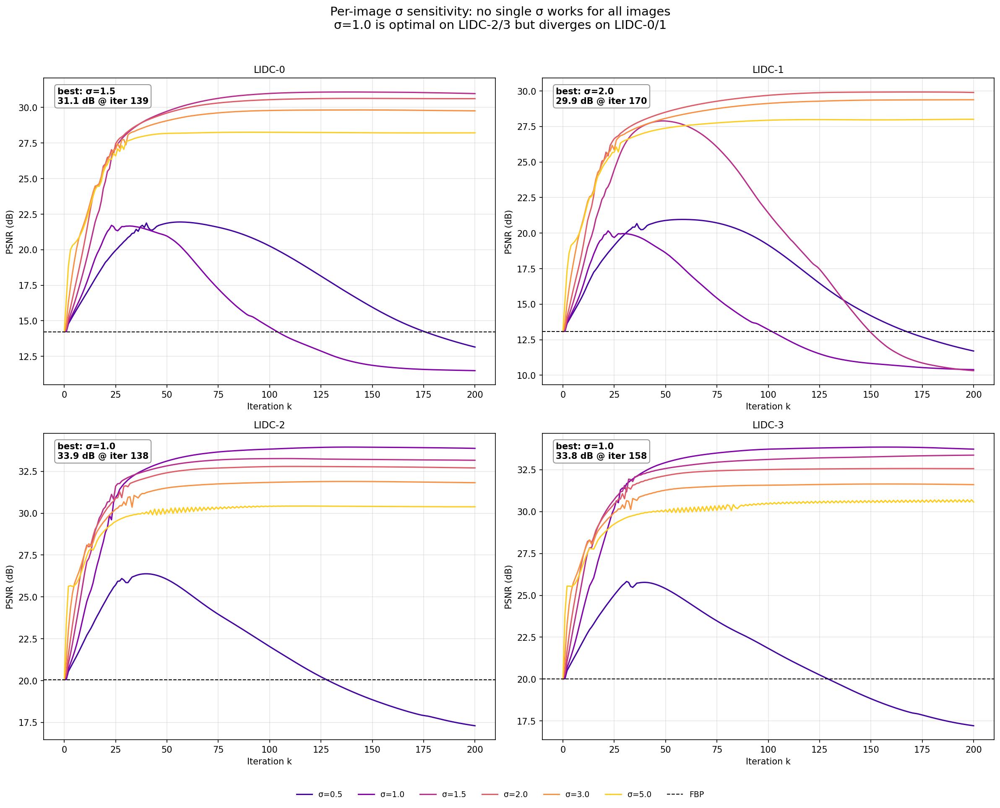


Per-image best-σ summary (µ=20.0, DRUNet):
  image      best σ   best PSNR    best iter 
  LIDC-0     1.5      31.08        139       
  LIDC-1     2.0      29.93        170       
  LIDC-2     1.0      33.95        138       
  LIDC-3     1.0      33.85        158       


In [ ]:
# define test images and labels
n_test     = min(4, len(test_imgs))
sigmas_mi  = [0.5, 1.0, 1.5, 2.0, 3.0, 5.0]
colours_mi = plt.cm.plasma(np.linspace(0.1, 0.9, len(sigmas_mi)))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.ravel()

# store per-panel results
per_image_results = []  

for ax_idx in range(n_test):
    
    # prepare gt and sinogram
    gt_i         = test_imgs[ax_idx]
    sino_clean_i = op.forward(gt_i)

    # scale to match gt
    SCALE_i = sino_clean_i.max() / gt_i.max()

    # fix seed for each image
    torch.manual_seed(ax_idx * 100)

    # scale sinogram to [0, 1] and add noise
    sino_scaled  = sino_clean_i / SCALE_i
    sino_noisy_i = sino_scaled + NOISE_STD * sino_scaled.std() * torch.randn_like(sino_scaled)
    y_i          = sino_noisy_i * SCALE_i

    # compute FBP and its PSNR for this image
    x_fbp_i    = ls_scale(gt_i, lion_fbp(y_i, op)).clamp(min=0)
    fbp_psnr_i = psnr(gt_i, x_fbp_i)

    # set tracking variables
    panel_best_psnr = -np.inf
    panel_best_sig  = None
    panel_best_iter = None

    for sig, col in zip(sigmas_mi, colours_mi):

        # run pnp-admm for image and σ
        hist, _ = run_pnp_admm(y_i, gt_i, admm_step, x_fbp_i, sigma=sig, mu=MU_DEFAULT)
        axes[ax_idx].plot(hist, color=col, lw=1.5, label=f"σ={sig}")

        # track best results
        if max(hist) > panel_best_psnr:
            panel_best_psnr = float(max(hist))
            panel_best_sig  = sig
            panel_best_iter = int(np.argmax(hist))

    per_image_results.append((test_labels[ax_idx], panel_best_sig, panel_best_psnr, panel_best_iter))

    # plot FBP baseline 
    axes[ax_idx].axhline(fbp_psnr_i, color="k", ls="--", lw=1, label="FBP")
    axes[ax_idx].set_title(test_labels[ax_idx], fontsize=11)
    axes[ax_idx].set_xlabel("Iteration k")
    axes[ax_idx].set_ylabel("PSNR (dB)")
    axes[ax_idx].grid(True, alpha=0.3)

    # add text with best vals in top left
    axes[ax_idx].text(0.03, 0.97,
                      f"best: σ={panel_best_sig}\n"
                      f"{panel_best_psnr:.1f} dB @ iter {panel_best_iter}",
                      transform=axes[ax_idx].transAxes, fontsize=10, fontweight="bold", va="top", ha="left", bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="grey", alpha=0.85))

# create shared legend
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="lower center", ncol=7, fontsize=9, bbox_to_anchor=(0.5, -0.04), frameon=False)

plt.suptitle("Per-image σ sensitivity: no single σ works for all images\n"
             "σ=1.0 is optimal on LIDC-2/3 but diverges on LIDC-0/1", y=1.02, fontsize=14)
plt.tight_layout()
plt.savefig(output_dir / "10_per_image_sigma_sensitivity.pdf", bbox_inches="tight")
plt.show()

# print summary
print("\nPer-image best-σ summary (µ={:.1f}, DRUNet):".format(MU_DEFAULT))
print(f"  {'image':<10} {'best σ':<8} {'best PSNR':<12} {'best iter':<10}")
for label, sig, p, it in per_image_results:
    print(f"  {label:<10} {sig:<8} {p:<12.2f} {it:<10}")

The four panels above show PnP-ADMM convergence, with each panel annotating the $\sigma$ that achieved the highest PSNR for that image, together with the iteration at which it peaked.

The headline finding is that no single $\sigma$ is optimal across all four images.